In [1]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import datasets, layers, Model, utils, optimizers, models
import json
import argparse
from tqdm import tqdm
from IPython.display import Image

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 21 samples, validate on 4 samples
Epoch 1/20
21/21 [==============================] - 4s 167ms/sample - loss: 2.2434 - acc: 0.1133 - val_loss: 1.5309 - val_acc: 0.0489
Epoch 2/20
21/21 [==============================] - 3s 140ms/sample - loss: 1.8391 - acc: 0.1719 - val_loss: 1.2929 - val_acc: 0.1188
Epoch 3/20
21/21 [==============================] - 3s 142ms/sample - loss: 1.4969 - acc: 0.2503 - val_loss: 1.0851 - val_acc: 0.2023
Epoch 4/20
21/21 [==============================] - 3s 142ms/sample - loss: 1.2130 - acc: 0.3466 - val_loss: 0.9061 - val_acc: 0.2769
Epoch 5/20
21/21 [==============================] - 3s 140ms/sample - loss: 0.9703 - acc: 0.4558 - val_loss: 0.7528 - val_acc: 0.3835
Epoch 6/20
21/21 [==============================] - 3s 144ms/sample - loss:

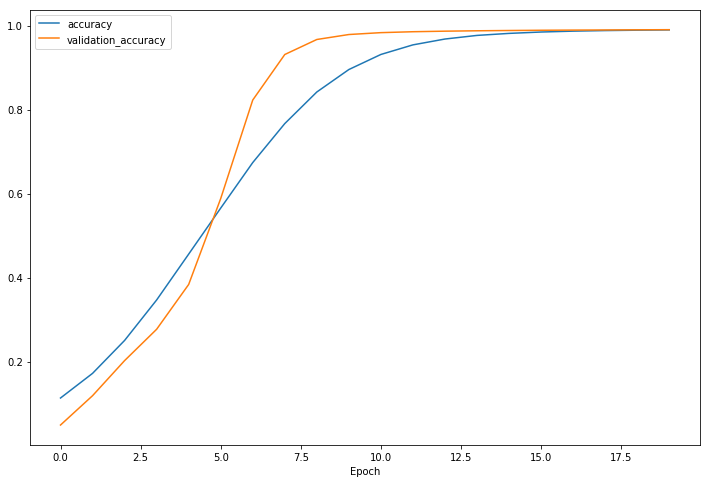

In [2]:
def dice_loss(y_true, y_pred):
    numerator = 2 * tf.reduce_sum(y_true * y_pred, axis=-1)
    denominator = tf.reduce_sum(y_true + y_pred, axis=-1)

    return 1 - (numerator + 1) / (denominator + 1)

#Read configuration file
with open('config.json') as f:
    config = json.load(f)

IMG_W = config['image_width']
IMG_H = config['image_height']

win_w = config['window_width']
win_h = config['window_height']

scaled_win_w = config['model_input_width']
scaled_win_h = config['model_input_height']

num_win_x = IMG_W/win_w
num_win_y = IMG_H/win_h

img_path = './Images/'
mask_path = './Masks/'
img_names = os.listdir(img_path)
mask_names = os.listdir(mask_path)


X = []
y = []

#Data Collection
for i in tqdm(range(len(img_names)), desc='Collecting Data'):

    #Obtain mask and image paths
    mask_path_i = os.path.join(mask_path, mask_names[i])
    img_name = mask_names[i].split('_mask')[0]+'.jpg'
    assert img_name in img_names, 'Expected {} in {}'.format(img_name, args['images'])
    img_path_i = os.path.join(img_path, img_name)

    #Read mask and img in
    mask = cv2.imread(mask_path_i, 0)
    ret, thresh = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)
    img = cv2.imread(img_path_i)
    scaled_img = cv2.resize(img, (scaled_win_w, scaled_win_h))/255.0
    scaled_mask = cv2.resize(thresh, (scaled_win_w, scaled_win_h))/255.0

    X.append(scaled_img)
    y.append(scaled_mask)

X = np.asarray(X)
y = np.asarray(y)

#Model Definition
num_channels = 3 #bgr

inputs = layers.Input((scaled_win_w, scaled_win_h, num_channels))

c1 = layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
c1 = layers.Dropout(0.1)(c1)
c1 = layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)

p1 = layers.MaxPooling2D((2,2))(c1)
c2 = layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = layers.Dropout(0.1)(c2)
c2 = layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)

p2 = layers.MaxPooling2D((2,2))(c2)
c3 = layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = layers.Dropout(0.2)(c3)
c3 = layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)

p3 = layers.MaxPooling2D((2,2))(c3)
c4 = layers.Conv2D(128, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = layers.Dropout(0.2)(c4)
c4 = layers.Conv2D(128, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)

u5 = layers.Conv2DTranspose(64, (2,2), strides=(2,2), padding='same')(c4)
u5 = layers.concatenate([u5,c3])
c5 = layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(u5)
c5 = layers.Dropout(0.2)(c5)
c5 = layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

u6 = layers.Conv2DTranspose(32, (2,2), strides=(2,2), padding='same')(c5)
u6 = layers.concatenate([u6,c2])
c6 = layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
c6 = layers.Dropout(0.1)(c6)
c6 = layers.Conv2D(32, (3,3), activation='linear', kernel_initializer='he_normal', padding='same')(c6)

u7 = layers.Conv2DTranspose(16, (2,2), strides=(2,2), padding='same')(c6)
u7 = layers.concatenate([u7,c1])
c7 = layers.Conv2D(16, (3,3), activation='linear', kernel_initializer='he_normal', padding='same')(u7)
c7 = layers.Dropout(0.1)(c7)
c7 = layers.Conv2D(16, (3,3), activation='linear', kernel_initializer='he_normal', padding='same')(c7)

outputs = layers.Conv2D(1,(1,1), activation='sigmoid')(c7)

model = Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer=optimizers.Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

#reshape y
if len(y.shape) < 4:
    y = np.expand_dims(y, axis=3)

#Shuffle
idx = np.random.permutation(len(X))
X = X[idx]
y = y[idx]

history = model.fit(X, y, epochs=20, batch_size=32, validation_split=0.15)

fig, ax = plt.subplots()
fig.set_size_inches(12,8)
ax.plot(history.history['acc'], label='accuracy')
ax.plot(history.history['val_acc'], label='validation_accuracy')
ax.set_xlabel('Epoch')
plt.legend()
plt.show()

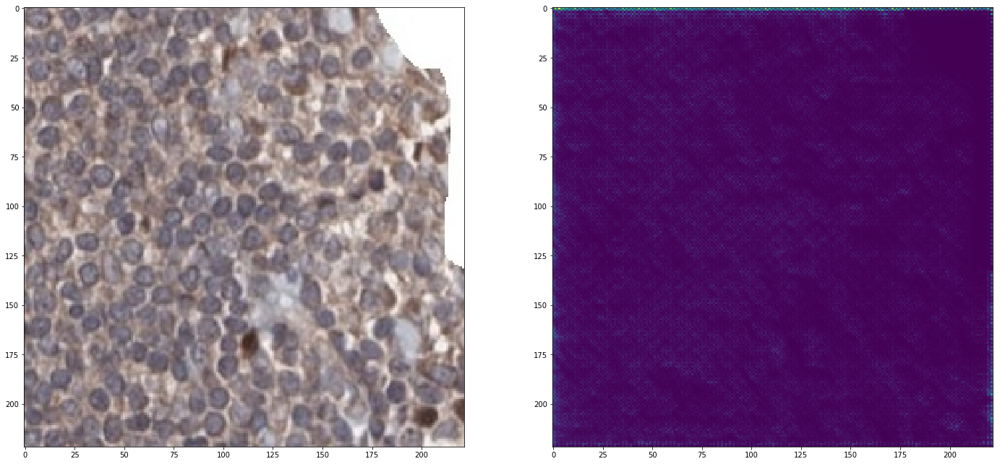

In [3]:
scaled_win_w = 224
scaled_win_h = 224
padless_win_w = scaled_win_w-2
padless_win_h = scaled_win_h-2
padding=1
X = []
imgs = os.listdir('Images')
img = cv2.imread('Images/'+imgs[0])

padless_img = cv2.resize(img, (padless_win_w, padless_win_h))/225.0
scaled_img = cv2.copyMakeBorder( padless_img, padding, padding, padding, padding, cv2.BORDER_REPLICATE)

X.append(scaled_img)
X = np.asarray(X)
y = model.predict(X)
mask = y[0][padding:-padding,padding:-padding]

fig,ax = plt.subplots(1,2)
fig.set_size_inches(24,12)
ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax[1].imshow(np.reshape(mask, (222, 222)))

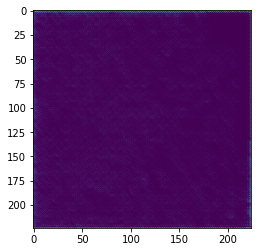

In [4]:
plt.imshow(np.reshape(y[0],y[0].shape[:-1]))

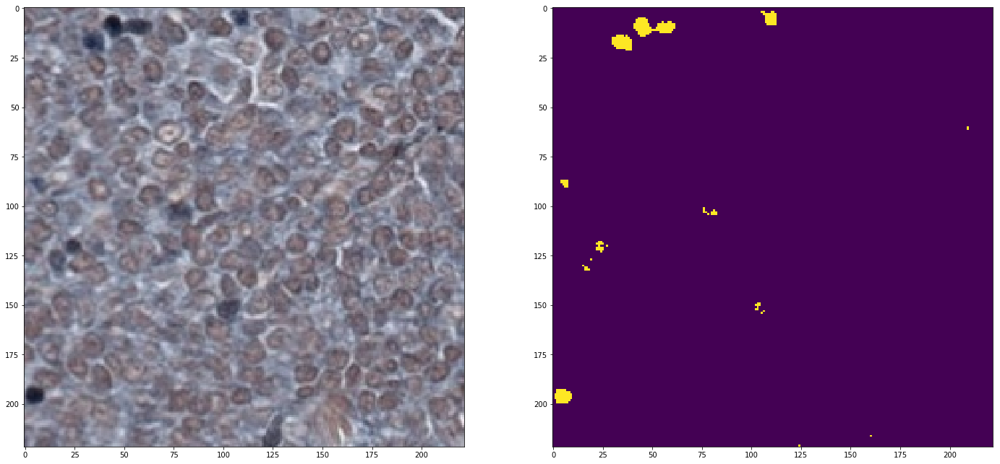

In [16]:
def relu(a):
    return a * (a > 0)

img_p = './Images/1554_1110.jpg'
img = cv2.imread(img_p)
fig,ax = plt.subplots(1,2)
fig.set_size_inches(24,12)
img_hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)

a = (255-img_hls[:,:,1])
a_n = (a-a.mean())/float(a.max())


b = img_hls[:,:,2]
b_n = (b-b.mean())/float(b.max())

mask = relu(a_n*b_n)
cutoff = 0.25*(mask.mean()+mask.max())
ret, thresh = cv2.threshold(mask, 3*mask.std(), 255, cv2.THRESH_BINARY)

ax[0].imshow(img)
ax[1].imshow(thresh)

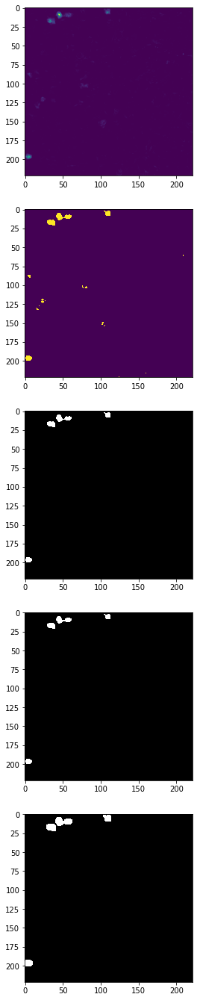

In [29]:
ret, thresh = cv2.threshold(mask, 3*mask.std(), 255, cv2.THRESH_BINARY)
thresh = np.uint8(thresh)
nb_components, output, stats, ckentroids = cv2.connectedComponentsWithStats(thresh, connectivity=8)
sizes = stats[1:, -1]; nb_components = nb_components - 1

min_size = 20

mask_zeros = np.zeros(img.shape)
#for every component in the image, you keep it only if it's above min_size
for i in range(0, nb_components):
    if sizes[i] >= min_size:
        mask_zeros[output == i + 1] = 255

#Close gaps in mask and dilate
kernel_c = np.ones((3,3),np.uint8)
kernel_d = np.ones((3,3),np.uint8)

mask_close = cv2.morphologyEx(mask_zeros, cv2.MORPH_CLOSE, kernel_c)
mask_dilate = cv2.dilate(mask_close,kernel_d,iterations = 1)

fig,ax = plt.subplots(5)
fig.set_facecolor('w')
fig.set_size_inches(12,24)
ax[0].imshow(mask)
ax[1].imshow(thresh)
ax[2].imshow(mask_zeros)
ax[3].imshow(mask_close)
ax[4].imshow(mask_dilate)


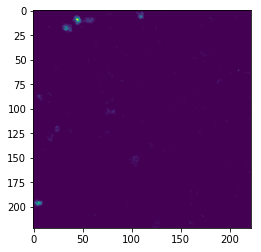

In [25]:
plt.imshow(np.uint8(mask*255))

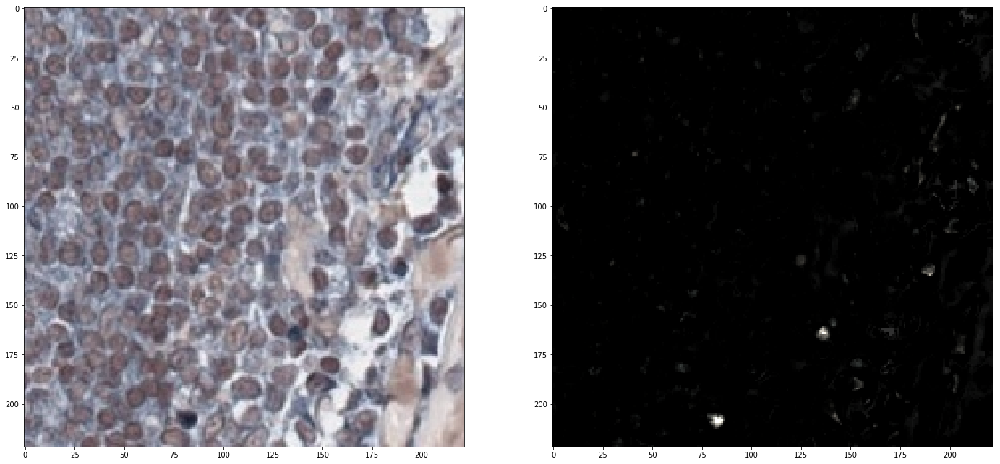

In [88]:
def relu(a):
    return a * (a > 0)

img_p = './Images/2220_1554.jpg'
img = cv2.imread(img_p)
#img = X[39]
fig,ax = plt.subplots(1,2)
fig.set_size_inches(24,12)
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
img_hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)

a = (255-img_hls[:,:,1])
a_n = (a-a.mean())/float(a.max())


b = img_hls[:,:,2]
b_n = (b-b.mean())/float(b.max())

mask = relu(a_n*b_n)

ret, thresh = cv2.threshold(mask, 3*mask.std(),255, cv2.THRESH_BINARY)
thresh = np.uint8(thresh)
nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(thresh, connectivity=8)
sizes = stats[1:, -1]; nb_components = nb_components - 1

min_size = 20

mask_proc = np.zeros(img.shape)
#for every component in the image, you keep it only if it's above min_size
for i in range(0, nb_components):
    if sizes[i] >= min_size:
        mask_proc[output == i + 1] = 255

#Close gaps in mask and dilate
kernel_c = np.ones((3,3),np.uint8)
kernel_d = np.ones((3,3),np.uint8)

mask_proc = cv2.morphologyEx(mask_proc, cv2.MORPH_CLOSE, kernel_c)
mask_proc = cv2.dilate(mask_proc,kernel_d,iterations = 1)

ax[0].imshow(img)
img_n = (img-img.mean())/float(img.max())
mask_n = (mask-mask.mean())/float(mask.max())
for _ in range(3):
    img_n[:,:,_] = (1-img_n[:,:,_])*mask_n
ax[1].imshow(img_n)

In [86]:
img_n.min()

-0.46200554907663693

In [51]:
def relu(a):
    return a * (a > 0)

img = cv2.imread('../artifact_segmentation/artifactless/tFL H_1_1_2_FOXP3_artifactless.jpg')
img_hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
a = (255-img_hls[:,:,1])
a_n = (a-a.mean())/float(a.max())


b = img_hls[:,:,2]
b_n = (b-b.mean())/float(b.max())

mask_global = relu(a_n*b_n)
#ret, mask_global = cv2.threshold(mask_global, 3*mask_global.std(),255, cv2.THRESH_BINARY)
mask_out = np.zeros(mask_global.shape)

X = []
masks = []
threshs = []
#Read configuration file
with open('config.json') as f:
    config = json.load(f)

IMG_W = config['image_width']
IMG_H = config['image_height']

win_w = config['window_width']
win_h = config['window_height']

scaled_win_w = config['model_input_width']
scaled_win_h = config['model_input_height']

padding = config['padding']

padless_win_w = scaled_win_w-2*padding
padless_win_h = scaled_win_h-2*padding

num_win_x = IMG_W/win_w
num_win_y = IMG_H/win_h

#Create image patches
cols = np.arange(0, num_win_x*win_w, win_w)
rows = np.arange(0, num_win_y*win_h, win_h)
for row in rows:
    for col in cols:
        win_img = img[col:col+win_w,row:row+win_w,:]
        img_hls = cv2.cvtColor(win_img, cv2.COLOR_BGR2HLS)

        a = (255-img_hls[:,:,1])
        a_n = (a-a.mean())/float(a.max())


        b = img_hls[:,:,2]
        b_n = (b-b.mean())/float(b.max())

        mask = relu(a_n*b_n)
        masks.append(mask)
        ret, thresh = cv2.threshold(mask, 3*mask.std(),255, cv2.THRESH_BINARY)
        thresh = np.uint8(thresh)
        threshs.append(thresh)
        nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(thresh, connectivity=8)
        sizes = stats[1:, -1]; nb_components = nb_components - 1

        min_size = 20

        mask_proc = np.zeros(win_img.shape[:2])
        #for every component in the image, you keep it only if it's above min_size
        for i in range(0, nb_components):
            if sizes[i] >= min_size:
                mask_proc[output == i + 1] = 255

        #Close gaps in mask and dilate
        kernel_c = np.ones((3,3),np.uint8)
        kernel_d = np.ones((3,3),np.uint8)

        mask_proc = cv2.morphologyEx(mask_proc, cv2.MORPH_CLOSE, kernel_c)
        mask_proc = cv2.dilate(mask_proc,kernel_d,iterations = 1)
        X.append(mask_proc)
        mask_out[col:col+win_w,row:row+win_w] = mask*mask_global[col:col+win_w,row:row+win_w]

X = np.asarray(X)


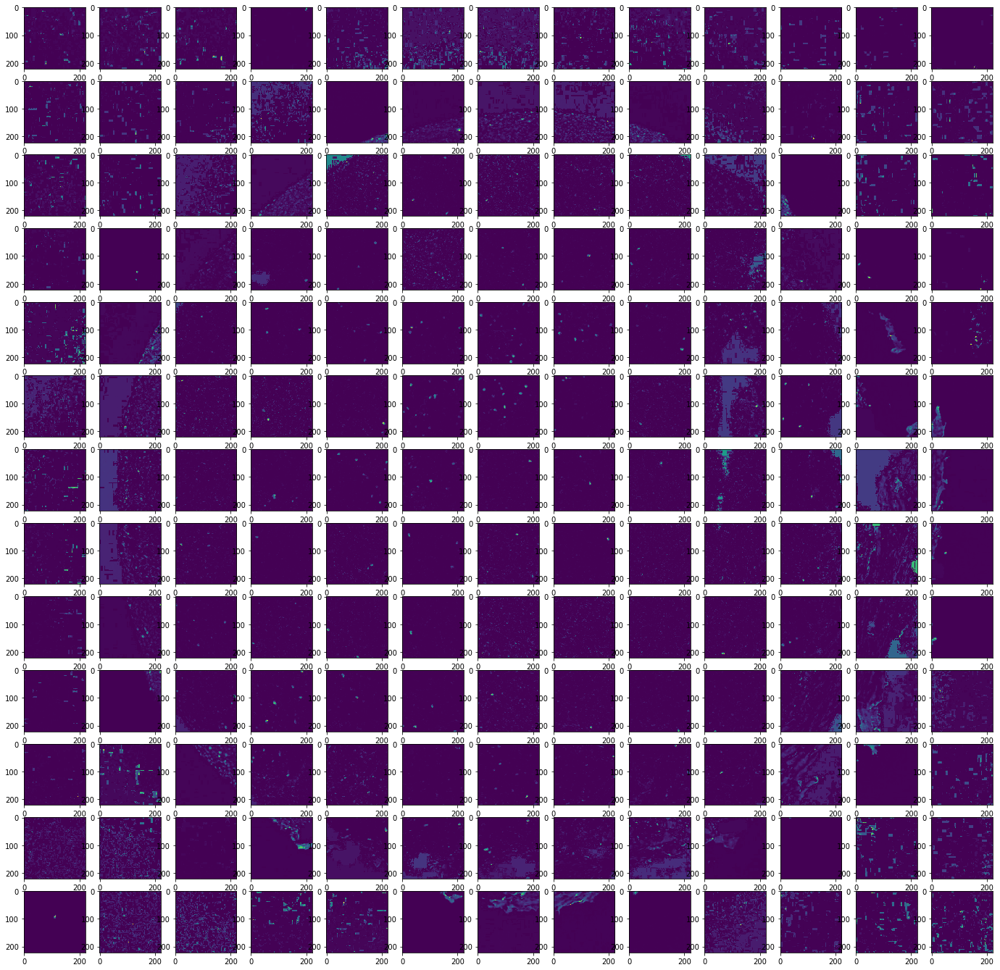

In [8]:
#Image Patches
fig,ax = plt.subplots(num_win_x,num_win_y)
fig.set_size_inches(24,24)
for i in range(len(ax)):
    for j in range(len(ax[0])):
        ax[j,i].imshow(masks[(i*num_win_x)+j])

In [22]:
masks[0].shape

(222, 222)

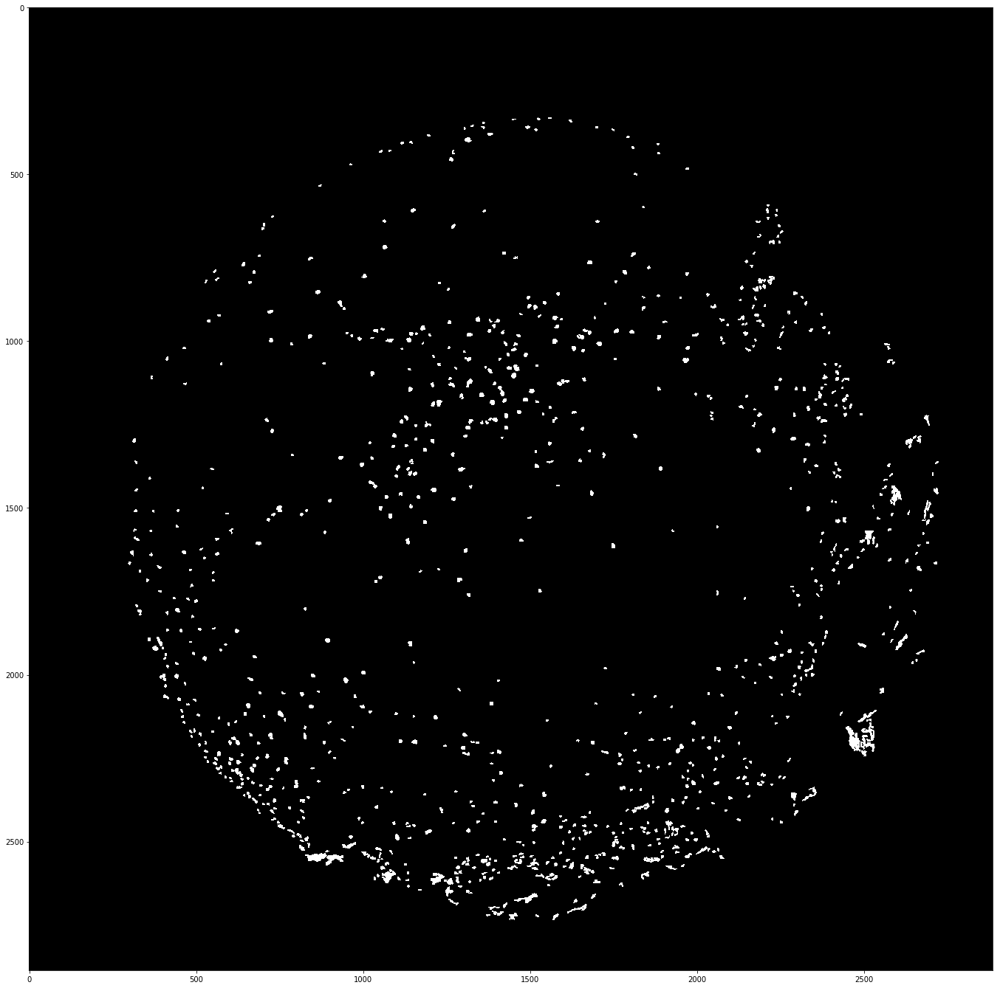

In [46]:
img_hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)

a = (255-img_hls[:,:,1])
a_n = (a-a.mean())/float(a.max())


b = img_hls[:,:,2]
b_n = (b-b.mean())/float(b.max())

mask = relu(a_n*b_n)

ret, thresh = cv2.threshold(mask, 3*mask.std(),255, cv2.THRESH_BINARY)
thresh = np.uint8(thresh)
nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(thresh, connectivity=8)
sizes = stats[1:, -1]; nb_components = nb_components - 1

min_size = 20

mask_proc = np.zeros(img.shape)
#for every component in the image, you keep it only if it's above min_size
for i in range(0, nb_components):
    if sizes[i] >= min_size:
        mask_proc[output == i + 1] = 255

#Close gaps in mask and dilate
kernel_c = np.ones((3,3),np.uint8)
kernel_d = np.ones((3,3),np.uint8)

mask_proc = cv2.morphologyEx(mask_proc, cv2.MORPH_CLOSE, kernel_c)
mask_proc = cv2.dilate(mask_proc,kernel_d,iterations = 1)

fig, ax = plt.subplots()
fig.set_size_inches(24,24)
ax.imshow(mask_proc)

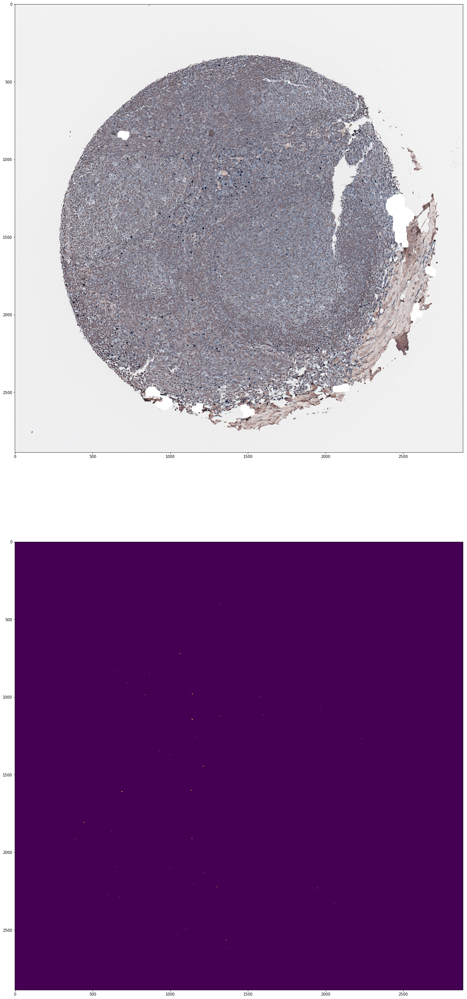

In [58]:
fig, ax = plt.subplots(2)
fig.set_size_inches(24,48)
ax[0].imshow(img)

ret, thresh = cv2.threshold(mask, 3*mask.std(),255, cv2.THRESH_BINARY)
thresh = np.uint8(thresh)
ax[1].imshow(thresh_out)

In [57]:
mask_o = np.uint8(mask_out*255)
thresh_out = cv2.adaptiveThreshold(mask_o, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 3,3)

In [37]:
mask_out

AttributeError: 'numpy.ndarray' object has no attribute 'type'

In [11]:
pad = 1

IMG_W = 2886
IMG_H = 2886

win_w = 222
win_h = 222

scaled_win_w = 224-2*pad
scaled_win_h = 224-2*pad

num_win_x = IMG_W/win_w
num_win_y = IMG_H/win_h

In [46]:
X = []
img_name = '../artifact_segmentation/artifactless/tFL H_1_1_2_FOXP3_artifactless.jpg'
img = cv2.imread(img_name)

cols = np.arange(0, num_win_x*win_w, win_w)
rows = np.arange(0, num_win_y*win_h, win_h)
for row in rows:
    for col in cols:
        win_img = img[col:col+win_w,row:row+win_w,:]
        #scaled_win_img = cv2.resize(win_img, (scaled_win_w, scaled_win_h))
        #scaled_win_img = cv2.copyMakeBorder( scaled_win_img, pad, pad, pad, pad, cv2.BORDER_REPLICATE)
        cv2.imwrite(os.path.join('training_patches/','%i_%i' %(row, col)+'.jpg'),win_img)

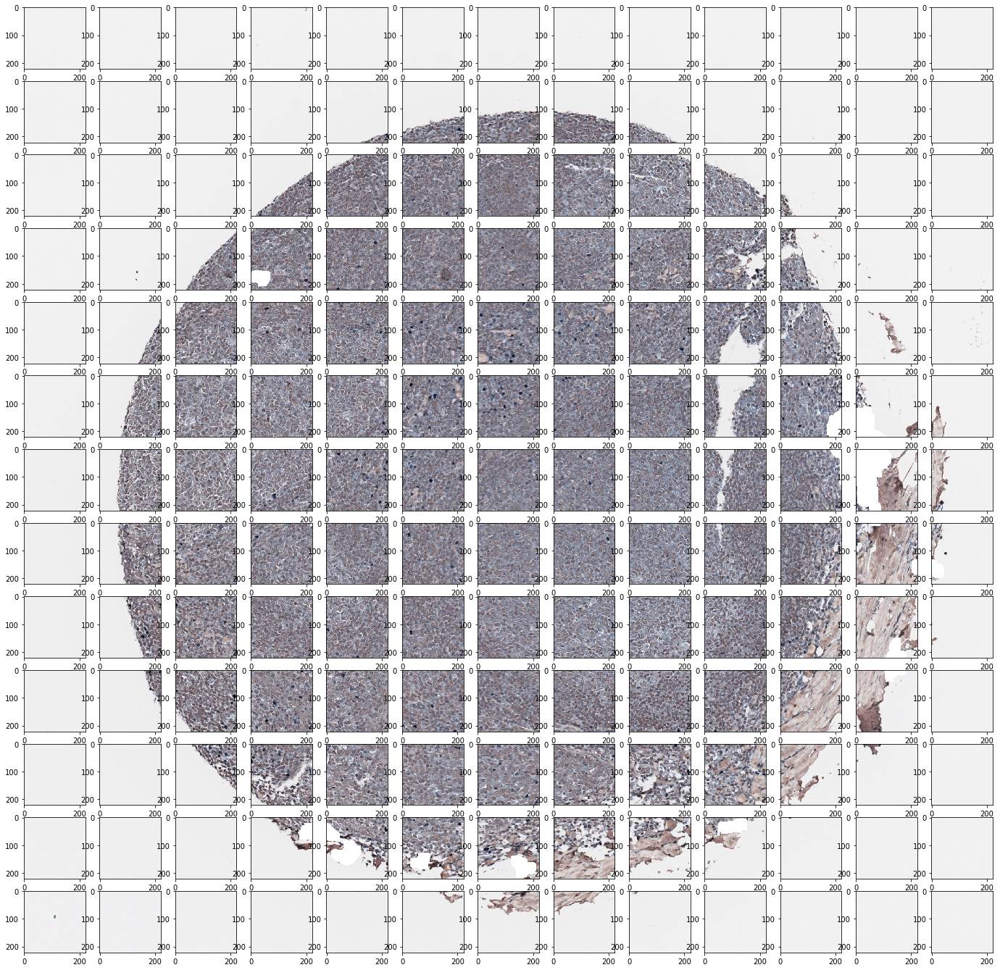

In [34]:
#Image Patches
fig,ax = plt.subplots(num_win_x,num_win_y)
fig.set_size_inches(24,24)
for i in range(len(ax)):
    for j in range(len(ax[0])):
        ax[j,i].imshow(X[(i*num_win_x)+j])

In [24]:
for i in range(len(X)):
    print(i, np.sum(1-X[i])*255/(224*224*3))

(0, 13.723260788690485)
(1, 14.007520195578243)
(2, 13.86936649659865)
(3, 13.947239051870755)
(4, 14.14989902210885)
(5, 14.865679474914971)
(6, 16.104086947278912)
(7, 16.18522799744898)
(8, 16.22443000637755)
(9, 16.03473772321429)
(10, 15.947079613095237)
(11, 15.570425435799322)
(12, 15.459901147959183)
(13, 13.701802986819738)
(14, 14.062333917942183)
(15, 14.071076477465992)
(16, 14.67704347363946)
(17, 29.289647108843543)
(18, 63.38984109268708)
(19, 76.30359800170066)
(20, 78.92851828231291)
(21, 62.96858391794216)
(22, 27.611514136904752)
(23, 16.46010044642857)
(24, 15.760815263605446)
(25, 15.439585990646265)
(26, 13.789580676020417)
(27, 14.174166932397965)
(28, 14.785568133503407)
(29, 60.12484056122447)
(30, 109.89571375425172)
(31, 106.24036724064625)
(32, 104.90737935799321)
(33, 110.74143680909864)
(34, 113.6313709077381)
(35, 112.00312234268705)
(36, 47.24440635629251)
(37, 16.396849755527207)
(38, 15.693505527210881)
(39, 14.065595769557826)
(40, 15.025616496598643)

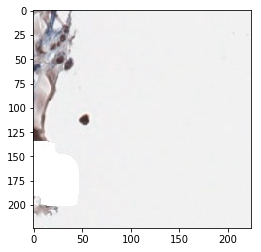

In [32]:
plt.imshow(X[163])

In [44]:
img_name = '../artifact_segmentation/artifactless/tFL H_1_1_2_FOXP3_artifactless.jpg'
os.path.join('training_patches/','%i_%i' %(row, col)+'.jpg')

'training_patches/2664_2664.jpg'

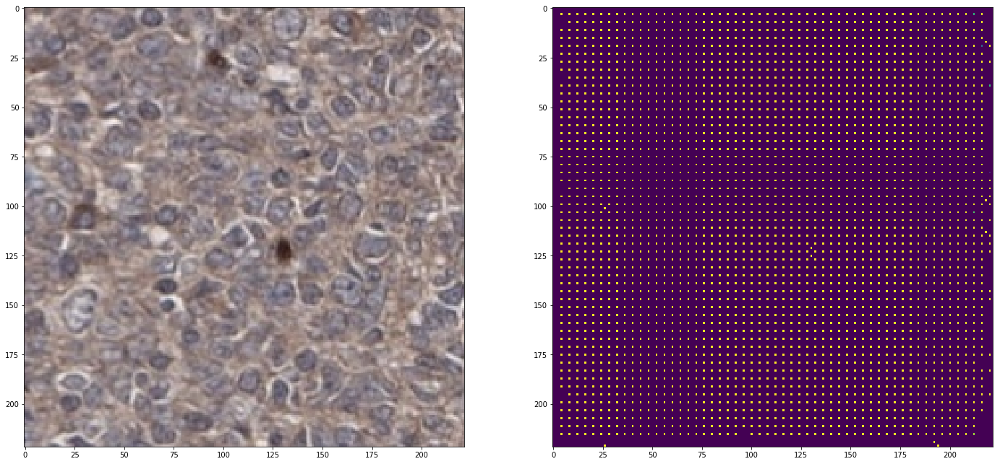

In [14]:
scaled_win_w = 224
scaled_win_h = 224
padless_win_w = scaled_win_w-2
padless_win_h = scaled_win_h-2
padding=1
X = []
imgs = os.listdir('Images')
img = cv2.imread('Images/'+imgs[8])
scaled_img = cv2.resize(img, (224, 224))/255.0

padless_img = cv2.resize(img, (padless_win_w, padless_win_h))
scaled_img = cv2.copyMakeBorder( padless_img, padding, padding, padding, padding, cv2.BORDER_REPLICATE)

X.append(scaled_img)
X = np.asarray(X)
y = model.predict(X)
mask = y[0][padding:-padding,padding:-padding]

fig,ax = plt.subplots(1,2)
fig.set_size_inches(24,12)
ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax[1].imshow(np.reshape(mask, (222, 222)))


## Splitting Image into Patches for Labelling

Here I take a certain number of artifactless images from the artifact segmentation and removal output and I appy some transformations. In this case, I select the inverse of the saturation channel and the lightness channels, both of which highlight the markers, and then I normalize and take the relu of their product. After some thresholding, I obtain a mask that highlights possible markers.
Next, I divide the image into smaller patches and check if the mask has a certain amount of predicted marker. These are then saved to be labelled.

In [2]:
def relu(a):
    return a * (a > 0)

image_folder = '../artifact_segmentation/artifactless/'
count = 3 #How many images to process
patch_folder = './image_patches/' #Where to store patches

for i, img in tqdm(enumerate(os.listdir(image_folder))):
    if i > count:
        break
    img_name = img.split('.')[0] #Take image name to identify what image patches belong to
    img_path = os.path.join(image_folder, img)
    img = cv2.imread(img_path)
    img_hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)

    a = (255-img_hls[:,:,1])
    a_n = (a-a.mean())/float(a.max())

    b = img_hls[:,:,2]
    b_n = (b-b.mean())/float(b.max())

    mask = relu(a_n*b_n)

    ret, thresh = cv2.threshold(mask, 3*mask.std(),255, cv2.THRESH_BINARY)
    thresh = np.uint8(thresh/255.0)
    
    cols = np.arange(0, num_win_x*win_w, win_w)
    rows = np.arange(0, num_win_y*win_h, win_h)
    for row in rows:
        for col in cols:
            #Look at thresh, if sum of all pixels > 200, save the patch
            thresh_patch = thresh[col:col+win_w,row:row+win_w]
            if np.sum(thresh_patch) > 300:
                win_img = img[col:col+win_w,row:row+win_w,:]
                cv2.imwrite(os.path.join(patch_folder,'%s_%i_%i' %(img_name,row, col)+'.jpg'),win_img)

0it [00:00, ?it/s]


NameError: name 'num_win_x' is not defined

## Model Definition and Training

Train on 33 samples, validate on 6 samples
Epoch 1/30
33/33 [==============================] - 6s 172ms/sample - loss: 0.2751 - dice_loss: 0.2751 - acc: 0.8613 - val_loss: 0.2235 - val_dice_loss: 0.2235 - val_acc: 0.9612
Epoch 2/30
33/33 [==============================] - 5s 166ms/sample - loss: 0.2362 - dice_loss: 0.2362 - acc: 0.9422 - val_loss: 0.1848 - val_dice_loss: 0.1848 - val_acc: 0.9611
Epoch 3/30
33/33 [==============================] - 5s 164ms/sample - loss: 0.1967 - dice_loss: 0.1967 - acc: 0.9605 - val_loss: 0.1532 - val_dice_loss: 0.1532 - val_acc: 0.9611
Epoch 4/30
33/33 [==============================] - 6s 168ms/sample - loss: 0.1605 - dice_loss: 0.1605 - acc: 0.9633 - val_loss: 0.1309 - val_dice_loss: 0.1309 - val_acc: 0.9611
Epoch 5/30
33/33 [==============================] - 6s 170ms/sample - loss: 0.1315 - dice_loss: 0.1315 - acc: 0.9637 - val_loss: 0.1139 - val_dice_loss: 0.1139 - val_acc: 0.9611
Epoch 6/30
33/33 [==============================] - 6s 172ms/sample

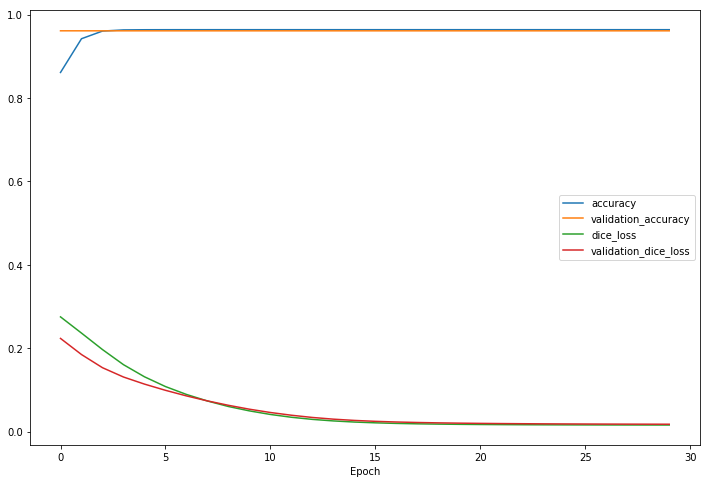

In [86]:
def dice_loss(y_true, y_pred):
    numerator = 2 * tf.reduce_sum(y_true * y_pred, axis=-1)
    denominator = tf.reduce_sum(y_true + y_pred, axis=-1)

    return 1 - (numerator + 1) / (denominator + 1)

#Read configuration file
with open('config.json') as f:
    config = json.load(f)

IMG_W = config['image_width']
IMG_H = config['image_height']

win_w = config['window_width']
win_h = config['window_height']

scaled_win_w = config['model_input_width']
scaled_win_h = config['model_input_height']

num_win_x = IMG_W/win_w
num_win_y = IMG_H/win_h

img_path = './Images/'
mask_path = './Masks/'
img_names = os.listdir(img_path)
mask_names = os.listdir(mask_path)

#Because of annotation software, there is a mismatch in naming
for img_name in img_names:
    img_path_curr = os.path.join(img_path, img_name)
    img_path_lower = os.path.join(img_path, img_name.lower())
    os.rename(img_path_curr, img_path_lower)

#After renaming to match Masks, get new names
img_names = os.listdir(img_path)
    
X = []
y = []

#Data Collection
for i in tqdm(range(len(img_names)), desc='Collecting Data'):

    #Obtain mask and image paths
    mask_path_i = os.path.join(mask_path, mask_names[i])
    img_name = mask_names[i].split('_mask')[0]+'.jpg'
    assert img_name in img_names, 'Expected {} in {}'.format(img_name, img_path)
    img_path_i = os.path.join(img_path, img_name)

    #Read mask and img in
    mask = cv2.imread(mask_path_i, 0)
    ret, thresh = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)
    img = cv2.imread(img_path_i)
    scaled_img = cv2.resize(img, (scaled_win_w, scaled_win_h))/255.0
    scaled_mask = cv2.resize(thresh, (scaled_win_w, scaled_win_h))/255.0

    X.append(scaled_img)
    y.append(scaled_mask)

X = np.asarray(X)
y = np.asarray(y)

#Model Definition
num_channels = 3 #bgr

inputs = layers.Input((scaled_win_w, scaled_win_h, num_channels))

c1 = layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
c1 = layers.Dropout(0.1)(c1)
c1 = layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)

p1 = layers.MaxPooling2D((2,2))(c1)
c2 = layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = layers.Dropout(0.1)(c2)
c2 = layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)

p2 = layers.MaxPooling2D((2,2))(c2)
c3 = layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = layers.Dropout(0.2)(c3)
c3 = layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)

# p3 = layers.MaxPooling2D((2,2))(c3)
# c4 = layers.Conv2D(128, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
# c4 = layers.Dropout(0.2)(c4)
# c4 = layers.Conv2D(128, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)

# u5 = layers.Conv2DTranspose(64, (2,2), strides=(2,2), padding='same')(c4)
# u5 = layers.concatenate([u5,c3])
# c5 = layers.Conv2D(64, (3,3), activation='linear', kernel_initializer='he_normal', padding='same')(u5)
# c5 = layers.Dropout(0.2)(c5)
# c5 = layers.Conv2D(64, (3,3), activation='linear', kernel_initializer='he_normal', padding='same')(c5)

#u6 = layers.Conv2DTranspose(32, (2,2), strides=(2,2), padding='same')(c3)
u6 = layers.UpSampling2D((2,2), interpolation='bilinear')(c3)
u6 = layers.concatenate([u6,c2])
c6 = layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
c6 = layers.Dropout(0.1)(c6)
c6 = layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

#u7 = layers.Conv2DTranspose(16, (2,2), strides=(2,2), padding='same')(c2)
u7 = layers.UpSampling2D((2,2), interpolation='bilinear')(c2)
u7 = layers.concatenate([u7,c1])
c7 = layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
c7 = layers.Dropout(0.1)(c7)
c7 = layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

outputs = layers.Conv2D(1,(1,1), activation='sigmoid')(c7)

model = Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer=optimizers.Adam(learning_rate=0.0001), loss=dice_loss, metrics=[dice_loss,'accuracy'])

#reshape y
if len(y.shape) < 4:
    y = np.expand_dims(y, axis=3)

#Shuffle
idx = np.random.permutation(len(X))
X = X[idx]
y = y[idx]

history = model.fit(X, y, epochs=30, batch_size=16, validation_split=0.15)

fig, ax = plt.subplots()
fig.set_size_inches(12,8)
fig.set_facecolor('w')
ax.plot(history.history['acc'], label='accuracy')
ax.plot(history.history['val_acc'], label='validation_accuracy')
ax.plot(history.history['dice_loss'], label='dice_loss')
ax.plot(history.history['val_dice_loss'], label='validation_dice_loss')
ax.set_xlabel('Epoch')
plt.legend()
plt.show()

## Running model on full-size image

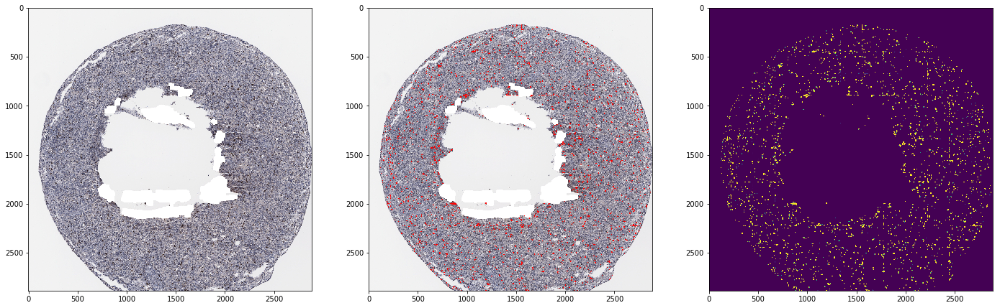

In [63]:
#Read configuration file
with open('config.json') as f:
    config = json.load(f)

IMG_W = config['image_width']
IMG_H = config['image_height']

win_w = config['window_width']
win_h = config['window_height']

scaled_win_w = config['model_input_width']
scaled_win_h = config['model_input_height']

num_win_x = IMG_W/win_w
num_win_y = IMG_H/win_h

padding=5

padless_win_w = scaled_win_w-2*padding
padless_win_h = scaled_win_h-2*padding


def post_proc(mask):
    int_mask = np.uint8(mask)

    #ret, thresh = cv2.threshold(int_mask, 0.1*np.max(int_mask), 255, cv2.THRESH_BINARY)
    ret, thresh = cv2.threshold(int_mask, 3*np.std(int_mask), 255, cv2.THRESH_BINARY)

    #Close gaps in mask and dilate
    kernel_c = np.ones((2,2),np.uint8)
    kernel_d = np.ones((5,5),np.uint8)

    mask_proc = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel_c)
    mask_proc = cv2.dilate(mask_proc,kernel_d,iterations = 1)
    #cv2.imshow('Img', mask)
    #cv2.waitKey(300)
    #cv2.imshow('Proc',mask_proc)
    #cv2.waitKey(300)
    return mask_proc

#Image
img_i = 1
image_dir = '../artifact_segmentation/artifactless/'
imgs = os.listdir(image_dir)
img_path = os.path.join(image_dir,imgs[img_i])
#img_path = '../artifact_segmentation/artifactless/tFL_B_1_4_4_FOXP3_artifactless.jpg'
img = cv2.imread(img_path)
X = []
patches = []
#Create image patches
cols = np.arange(0, num_win_x*win_w, win_w)
rows = np.arange(0, num_win_y*win_h, win_h)
for row in rows:
    for col in cols:
        win_img = img[col:col+win_w,row:row+win_w,:]/255.0

        padless_win_img = cv2.resize(win_img, (padless_win_w, padless_win_h))
        scaled_win_img = cv2.copyMakeBorder( padless_win_img, padding, padding, padding, padding, cv2.BORDER_ISOLATED)

        X.append(scaled_win_img)

X = np.asarray(X)

#Get y patches
y = model.predict(X)

#Create mask
mask = np.zeros((num_win_x*padless_win_w, num_win_y*padless_win_h))

cols = np.arange(0, num_win_x*padless_win_w, padless_win_w)
rows = np.arange(0, num_win_y*padless_win_h, padless_win_h)

for i in range(len(rows)):
    for j in range(len(cols)):
        patch = y[(i*num_win_x)+j][padding:-padding,padding:-padding] #remove padding
        patch = np.reshape(patch, (padless_win_w, padless_win_h)) #remove last dimension
        patch = post_proc(patch*255)
        patches.append(patch)
        mask[cols[j]:cols[j]+padless_win_h,rows[i]:rows[i]+padless_win_w] = patch#*255

resized_mask = cv2.resize(mask, (IMG_W, IMG_H))
#resized_mask = post_proc(resized_mask)
img_o = img.copy()
idx = np.where(resized_mask == 255)
img_o[idx] = [0,0,255]

fig,ax = plt.subplots(1,3)
fig.set_size_inches(24,24)
ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax[1].imshow(cv2.cvtColor(img_o, cv2.COLOR_BGR2RGB))
ax[2].imshow(resized_mask)
name = imgs[img_i].split('.')[0]
cv2.imwrite(name+'_dist_proc_full_pad_10.jpg',img_o)
cv2.imwrite(name+'_mask_proc_full_pad_10.jpg', resized_mask)
plt.show()
cv2.destroyAllWindows()

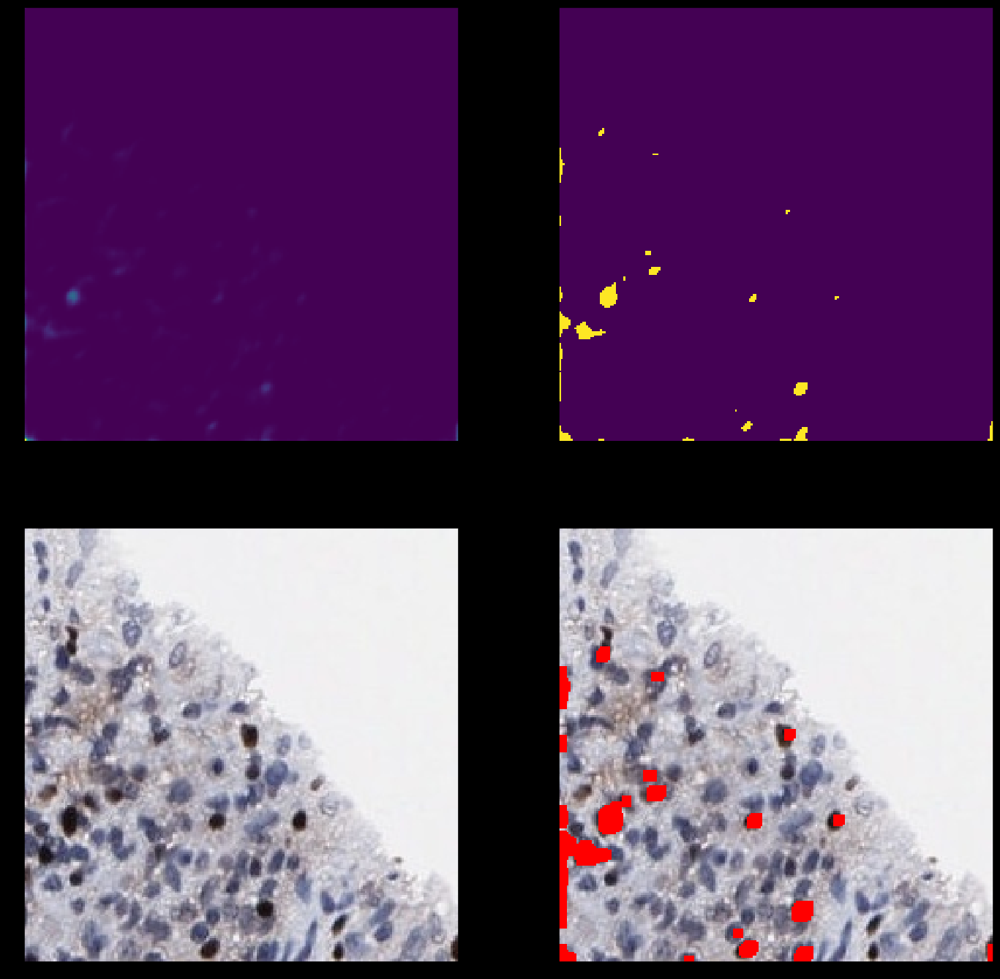

In [87]:
scaled_win_w = 224
scaled_win_h = 224
padding=2
padless_win_w = scaled_win_w-2*padding
padless_win_h = scaled_win_h-2*padding
X_p = []
imgs = os.listdir('Images')
img = cv2.imread('Images/'+imgs[33])

#scaled_img = cv2.resize(img, (scaled_win_w, s8aled_win_h))/225.0
scaled_img = cv2.resize(img, (padless_win_w, padless_win_h))/225.0
scaled_img = cv2.copyMakeBorder( scaled_img, padding, padding, padding, padding, cv2.BORDER_CONSTANT, np.mean(int_mask))

X_p.append(scaled_img)
X_p = np.asarray(X_p)
y = model.predict(X_p)
mask_o = y[0][padding:-padding,padding:-padding]

mask = mask_o*255.0
resized_mask = cv2.resize(mask, img.shape[:2])

int_mask = np.uint8(resized_mask)

#ret, thresh = cv2.threshold(int_mask, 0.1*np.max(int_mask), 255, cv2.THRESH_BINARY)
ret, thresh = cv2.threshold(int_mask, np.mean(int_mask)+3*np.std(int_mask), 255, cv2.THRESH_BINARY)

nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(thresh, connectivity=8)
sizes = stats[1:, -1]; nb_components = nb_components - 1

min_size = 1

mask_proc = np.zeros(img.shape[:2])
#for every component in the image, you keep it only if it's above min_size
for i in range(0, nb_components):
    if sizes[i] >= min_size:
        mask_proc[output == i + 1] = 255

#Close gaps in mask and dilate
kernel_c = np.ones((2,2),np.uint8)
kernel_d = np.ones((5,5),np.uint8)

mask_proc = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel_c)
mask_proc = cv2.dilate(mask_proc,kernel_d,iterations = 1)

img_o = img.copy()
idx = np.where(mask_proc == 255)
img_o[idx] = [0,0,255]

fig,ax = plt.subplots(2,2)
fig.set_size_inches(24,24)
fig.set_facecolor('k')
ax[0,0].imshow(np.reshape(mask_o, (220, 220)))
ax[0,1].imshow(thresh)
ax[1,0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax[1,1].imshow(cv2.cvtColor(img_o, cv2.COLOR_BGR2RGB))
plt.savefig('marker_seg_ex.jpg')
plt.show()

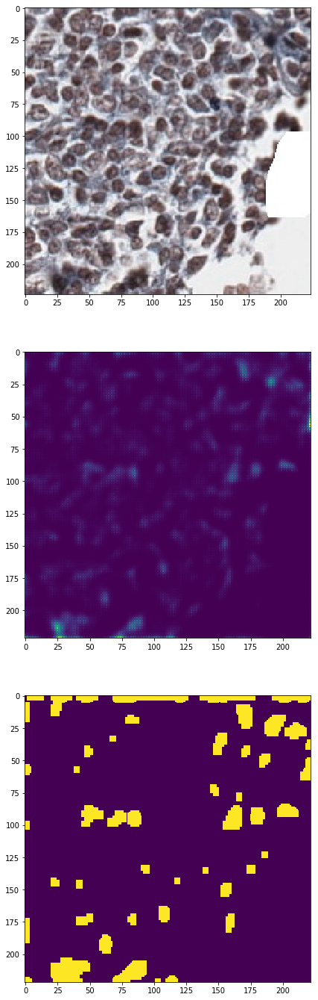

In [52]:
fig, ax = plt.subplots(3)
fig.set_size_inches(32,24)

i=43
m = np.reshape(y[i], y[i].shape[:2])[padding:-padding,padding:-padding]*255
ax[1].imshow(m)
ax[0].imshow(X[i])
ax[2].imshow(post_proc(np.reshape(m, (padless_win_w, padless_win_h))))


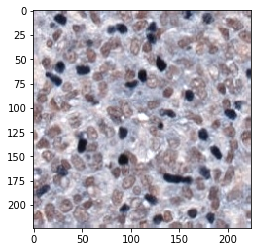

In [50]:
plt.imshow(scaled_img)

In [118]:
with tf.Session() as sess:  c =d.eval()

In [119]:
c.max()

0.5

In [145]:
n = list(y[0].shape[:2])

In [146]:
n.append(1)

In [147]:
n

[224, 224, 1]

In [152]:
c.shape

(222, 222, 1)

In [170]:
m.min()

0.0

In [67]:
#Image
i = 0
image_dir = '../artifact_segmentation/artifactless/'
imgs = os.listdir(image_dir)
img_path = os.path.join(image_dir,imgs[i])

In [68]:
img_path

'../artifact_segmentation/artifactless/tfl_b_1_8_10_foxp3_artifactless.jpg'

In [52]:
cv2.destroyAllWindows()

In [85]:
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_32 (Conv2D)              (None, 224, 224, 16) 448         input_6[0][0]                    
__________________________________________________________________________________________________
dropout_14 (Dropout)            (None, 224, 224, 16) 0           conv2d_32[0][0]                  
__________________________________________________________________________________________________
conv2d_33 (Conv2D)              (None, 224, 224, 16) 2320        dropout_14[0][0]                 
____________________________________________________________________________________________